In [1]:
import pandas as pd
from matplotlib import pyplot as plt 
import numpy as np

In [2]:
df=pd.read_csv(r"C:\Users\komal\OneDrive\Documents\MNIST_train.csv")

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df.shape

(42000, 785)

In [6]:
x=df.iloc[:,1:]
y=df.iloc[:,0]

from sklearn.model_selection import train_test_split
x_train , x_test , y_train , y_test = train_test_split(x ,y, test_size=0.2, random_state =42)

In [10]:
x_train.shape

(33600, 784)

In [13]:
#step 1: mean centering so apply standard scaler on data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [41]:
# we can find out optimum number of principle components
from sklearn.decomposition import PCA
pca_opt= PCA(n_components=None)  
x_train_trf = pca_opt.fit_transform(x_train)
x_test_trf = pca_opt.transform(x_test) 

In [87]:
#explained varience(eigen values)
pca_opt.explained_variance_

array([3.35506576e+05, 2.44807105e+05, 2.12051035e+05, 1.85066153e+05,
       1.68000246e+05, 1.48918349e+05, 1.12510833e+05, 9.93294844e+04,
       9.51402644e+04, 7.99789771e+04, 7.18729893e+04, 7.02954186e+04,
       5.86421706e+04, 5.77978479e+04, 5.44160811e+04, 5.10942763e+04,
       4.54324809e+04, 4.40877557e+04, 4.06349678e+04, 3.95293850e+04,
       3.69465718e+04, 3.51694514e+04, 3.31919492e+04, 3.14980784e+04,
       3.03792806e+04, 2.86216441e+04, 2.79878549e+04, 2.66233147e+04,
       2.54782977e+04, 2.38073682e+04, 2.26921743e+04, 2.17431167e+04,
       2.07130988e+04, 2.02157853e+04, 1.92920932e+04, 1.85377184e+04,
       1.74405813e+04, 1.67269421e+04, 1.61818599e+04, 1.59519157e+04,
       1.55375765e+04, 1.52480605e+04, 1.43023838e+04, 1.35853438e+04,
       1.31721648e+04, 1.28124366e+04, 1.23858612e+04, 1.19793099e+04,
       1.14757321e+04, 1.09198370e+04, 1.07891523e+04, 1.05497976e+04,
       1.00392867e+04, 9.83967219e+03, 9.58435154e+03, 9.24819162e+03,
      

In [49]:
#percentage of explained varience 
pca_opt.explained_variance_ratio_

array([9.77072202e-02, 7.12934512e-02, 6.17541312e-02, 5.38955140e-02,
       4.89255299e-02, 4.33684433e-02, 3.27657386e-02, 2.89270270e-02,
       2.77070300e-02, 2.32917149e-02, 2.09310651e-02, 2.04716403e-02,
       1.70779469e-02, 1.68320607e-02, 1.58472125e-02, 1.48798267e-02,
       1.32309818e-02, 1.28393670e-02, 1.18338358e-02, 1.15118647e-02,
       1.07596902e-02, 1.02421519e-02, 9.66625789e-03, 9.17296381e-03,
       8.84714420e-03, 8.33528008e-03, 8.15070612e-03, 7.75332066e-03,
       7.41986542e-03, 6.93325236e-03, 6.60848230e-03, 6.33209492e-03,
       6.03213006e-03, 5.88730096e-03, 5.61830060e-03, 5.39860932e-03,
       5.07909781e-03, 4.87126968e-03, 4.71252924e-03, 4.64556419e-03,
       4.52489910e-03, 4.44058540e-03, 4.16518263e-03, 3.95636411e-03,
       3.83603691e-03, 3.73127577e-03, 3.60704723e-03, 3.48865016e-03,
       3.34199674e-03, 3.18010732e-03, 3.14204894e-03, 3.07234334e-03,
       2.92367086e-03, 2.86553852e-03, 2.79118328e-03, 2.69328579e-03,
      

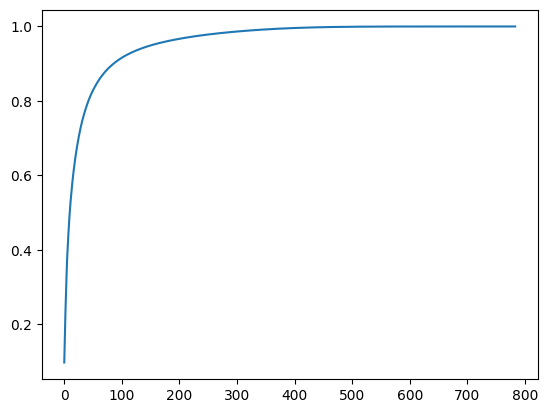

In [57]:
#plot cummulative sum of eigen varience ratio to easily identify optimum no. of priciple components
plt.plot(np.cumsum(pca_opt.explained_variance_ratio_))
plt.show()

In [59]:
#by above plot we can observe that nearby 200 principle components explained varience is 90% so we will choose n_components as 200
pca= PCA(n_components=200)  
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test) 

In [61]:
x_train_trf.shape

(33600, 200)

In [67]:
#train the model
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(x_train_trf, y_train)

,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [69]:
import time
start = time.time()
y_pred = knn.predict(x_test_trf)
print("time required for prediction", time.time()-start) 

time required for prediction 9.210937976837158


In [71]:
from sklearn.metrics import accuracy_score
acc= accuracy_score(y_test,y_pred)
print("Accuracy:",acc)

Accuracy: 0.9675


In [73]:
# You can visualize the data in 2D AND 3D by choosing principal components as 2 and 3, we can't visualize 784 columns so PCA can be used to do it
pca2=PCA(n_components=2) #2D 
x_train_trf2 = pca2.fit_transform(x_train)
x_test_trf2 = pca2.transform(x_test)

x_train_trf2.shape

(33600, 2)

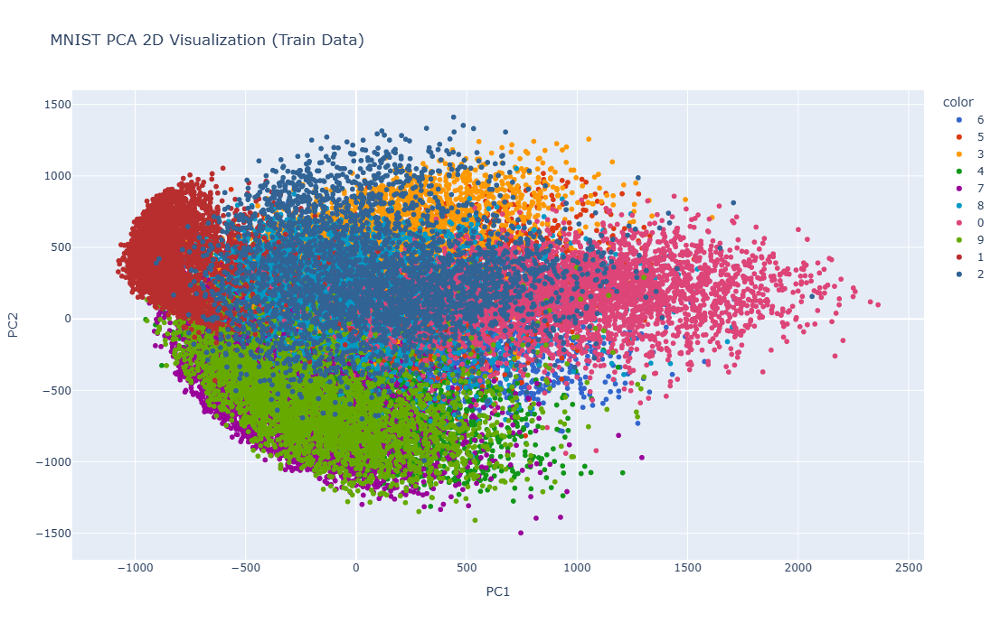

In [75]:
import plotly.express as px

fig = px.scatter(
    x=x_train_trf2[:, 0],  # first principal component
    y=x_train_trf2[:, 1],  # second principal component
    color=y_train.astype(str), 
    color_discrete_sequence=px.colors.qualitative.G10,
    labels={'x':'PC1', 'y':'PC2'},
    title='MNIST PCA 2D Visualization (Train Data)'
)

fig.update_layout(width=900, height=700)
fig.show()


In [77]:
#3D plot
pca3=PCA(n_components=3) #2D 
x_train_trf3 = pca3.fit_transform(x_train)
x_test_trf3 = pca3.transform(x_test)


In [79]:
x_train_trf3.shape

(33600, 3)

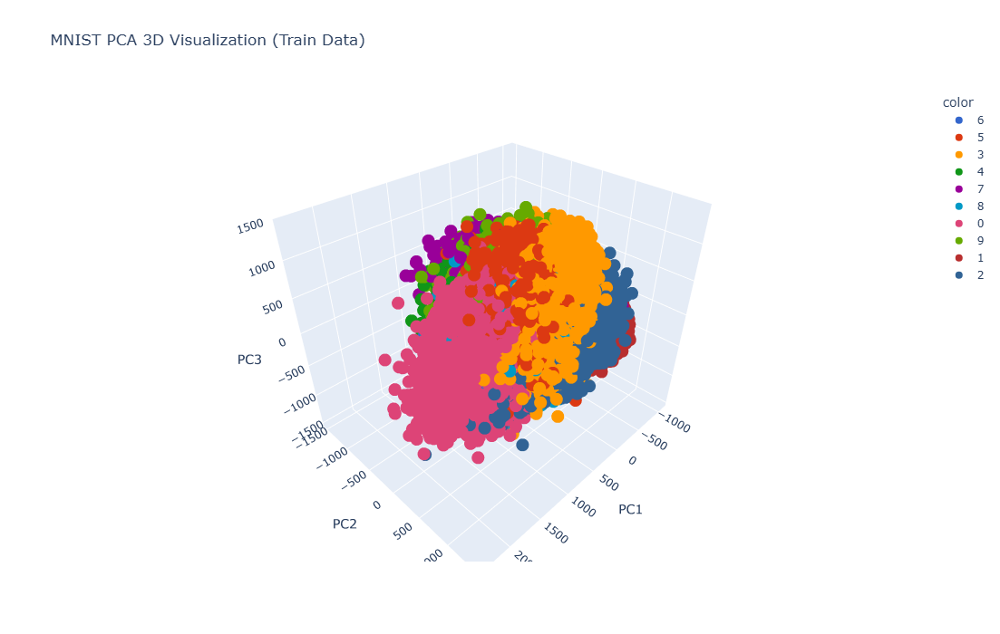

In [85]:
import plotly.express as px

fig = px.scatter_3d(
    x=x_train_trf3[:, 0],  # PC1
    y=x_train_trf3[:, 1],  # PC2
    z=x_train_trf3[:, 2],  # PC3
    color=y_train.astype(str),  # label colors
    color_discrete_sequence=px.colors.qualitative.G10,
    labels={'x':'PC1', 'y':'PC2', 'z':'PC3'},
    title='MNIST PCA 3D Visualization (Train Data)'
)

fig.update_layout(width=1000, height=700)
fig.show()
